# Introduction
In this notebook, we will explore various models to classify plant images. Specifically, we’ll be utilizing ResNet, EfficientNet, and Vision Transformer. Our approach involves training each model on our dataset and then comparing their performance to determine which one excels at plant image classification.

## Table of Contents

1. Import Library
2. Load Data
3. EDA
4. PreProcessing
5. Build Models
6. Training
7. Model Performance Evaluation

## 1. Import Library

In [1]:
# PyTorch and related libraries
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import timm

# Data manipulation and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Utility libraries
from pathlib import Path
from tqdm.notebook import tqdm
from typing import Dict, List, Tuple
import random
import os
import warnings
import time

# Scikit-learn for preprocessing and evaluation
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_recall_fscore_support, accuracy_score, top_k_accuracy_score, f1_score, matthews_corrcoef, confusion_matrix, ConfusionMatrixDisplay,f1_score, roc_auc_score

warnings.filterwarnings("ignore")

In [2]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'  # Number of GPU devices available. Returns 0 if no GPU is available.
NUM_DEVICES = torch.cuda.device_count()
NUM_WORKERS = os.cpu_count()
NUM_CLASSES = 47   #Class:refers to the number of categories or classes to be distinguished or judged.
EPOCHS = 24 
BATCH_SIZE = 16
LR = 0.001   #0.001
APPLY_SHUFFLE = True  #  Whether to shuffle the dataset before training. Shuffling helps in better model generalization.
SEED = 100
HEIGHT = 256
WIDTH = 256
CHANNELS = 3
IMAGE_SIZE = (256, 256, 3)

## 2. Load Dataset

In [3]:
TRAIN_PATH = Path("/kaggle/input/house-plant-species/house_plant_species")
IMAGE_PATH_LIST = list(TRAIN_PATH.glob("*/*.jpg"))
print(f'Total Images = {len(IMAGE_PATH_LIST)}')

Total Images = 13031


## 3 - Pre-Processing

### 3.1 - Convert to dataframe format

In [4]:
# Initialize lists to store image paths and labe;s.
# The length of these lists is equal to the number of images in IMAGE_PATH_LIST
images_path = [None] * len(IMAGE_PATH_LIST)
labels = [None] * len(IMAGE_PATH_LIST)

for i,img_path in enumerate(IMAGE_PATH_LIST):
    images_path[i] = img_path
    labels[i] = img_path.parent.stem

dataset_df = pd.DataFrame({'image_path': images_path,
                           'label': labels})
dataset_df.head()

,image_path,label
0,/kaggle/input/house-plant-species/house_plant_...,Orchid
1,/kaggle/input/house-plant-species/house_plant_...,Orchid
2,/kaggle/input/house-plant-species/house_plant_...,Orchid
3,/kaggle/input/house-plant-species/house_plant_...,Orchid
4,/kaggle/input/house-plant-species/house_plant_...,Orchid


### 3.2 - Distribution of Labels

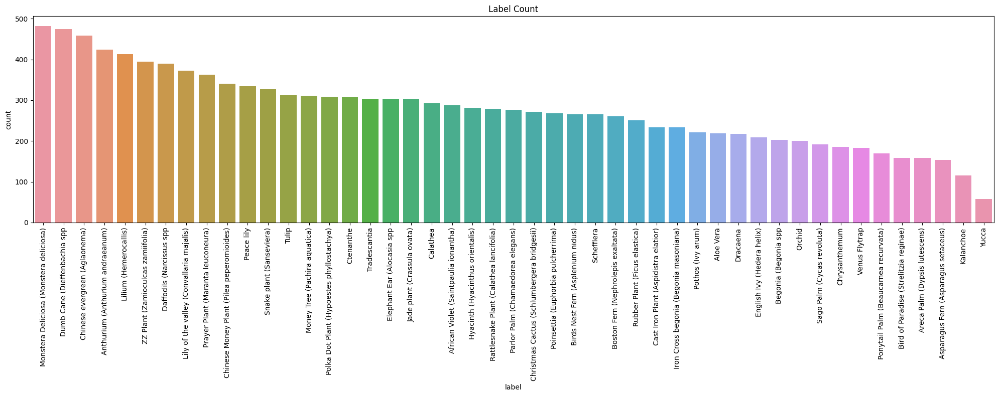

In [5]:
sorted_counts = dataset_df['label'].value_counts().sort_values(ascending=False)
plt.figure(figsize=(20, 8))
sns.countplot(x=dataset_df['label'], order=sorted_counts.index)
plt.title('Label Count')
plt.xticks(rotation=90, fontsize=10)
plt.tight_layout()
plt.show()

### 3.3 - View Random Sample Images

In [6]:
def _load(image_path, as_tensor=True):
    image = Image.open(image_path)
    if as_tensor:
        converter = transforms.ToTensor()
        return converter(image)
    else:
        return image

def view_sample(image, label, color_map='rgb', fig_size=(8,10)):
    plt.figure(figsize=fig_size)

    if color_map=='rgb':
        plt.imshow(image)
    else:
        plt.imshow(image, cmap=color_map)

    plt.title(f'Label: {label}', fontsize=16)
    return

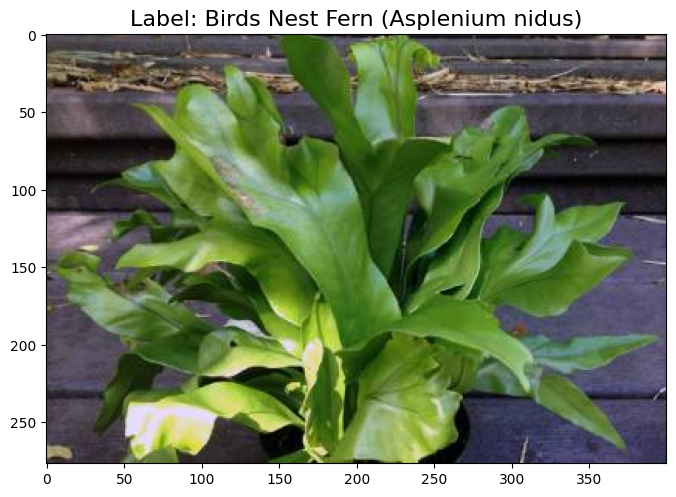

In [7]:
# Select random sample from train_df
idx = random.sample(dataset_df.index.to_list(),1)[0]

sample_image, sample_label = _load(dataset_df.image_path[idx]), dataset_df.label[idx]
view_sample(sample_image.permute(1,2,0), sample_label)

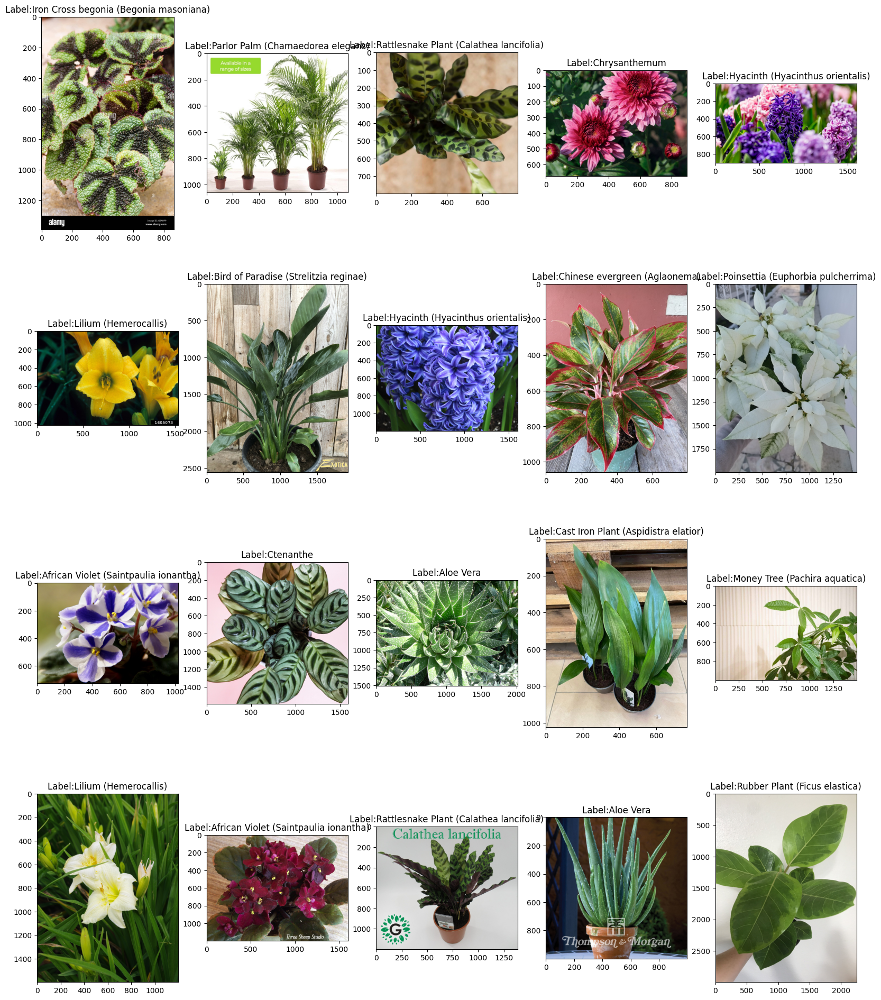

In [8]:
def view_multiple_samples(df, sample_loader, count = 10, color_map='rgb', fig_size=(14, 10)):
    rows = count//5
    if count%5 > 0:
        rows += 1

    idx = random.sample(df.index.to_list(), count)
    fig = plt.figure(figsize=fig_size)

    for column, _ in enumerate(idx):
        plt.subplot(rows, 5, column+1)
        plt.title(f'Label:{df.label[_]}')

        if color_map=='rgb':
            plt.imshow(sample_loader(df.image_path[_]).permute(1,2,0))
        else:
            plt.imshow(sample_loader(df.image_path[_]).permute(1,2,0), cmap=color_map)
    return

# Call view_multiple_samples function to display 20 random sample images.
view_multiple_samples(
    dataset_df, _load,
    count = 20, fig_size=(20, 24))

### 3.4 - Split train/valid/test data

In [9]:
train_split_idx, temp_split_idx, _, _ = (
    train_test_split(dataset_df.index,
                    dataset_df.label,
                    test_size=0.30,
                    stratify=dataset_df.label,
                    random_state=SEED))

In [10]:
train_df = dataset_df.iloc[train_split_idx].reset_index(drop=True)
temp_df = dataset_df.iloc[temp_split_idx].reset_index(drop=True)

train_df.shape, temp_df.shape

((9121, 2), (3910, 2))

In [11]:
val_split_idx, test_split_idx, _,_ = (
    train_test_split(
        temp_df.index,
        temp_df.label,
        test_size=0.5,
        stratify=temp_df.label,
        random_state=SEED
    )
)

In [12]:
val_df = temp_df.iloc[val_split_idx].reset_index(drop=True)
test_df = temp_df.iloc[test_split_idx].reset_index(drop=True)

val_df.shape, test_df.shape

((1955, 2), (1955, 2))

### 3.5 - View train/valid/test data counts

In [13]:
train_size = len(train_df)
val_size = len(val_df)
test_size = len(test_df)
total = train_size + val_size + test_size

print(f'train samples count:\t\t{train_size}\t({(100 * train_size/total):.2f}%)')
print(f'validation samples count:\t{val_size}\t({(100 * val_size/total):.2f}%)')
print(f'test samples count:\t\t{test_size}\t({(100 * test_size/total):.2f}%)')
print('================================================')
print(f'Total:\t\t\t\t{total}\t({(100 * total/total):.2f}%)')

train samples count:		9121	(69.99%)
validation samples count:	1955	(15.00%)
test samples count:		1955	(15.00%)
Total:				13031	(100.00%)


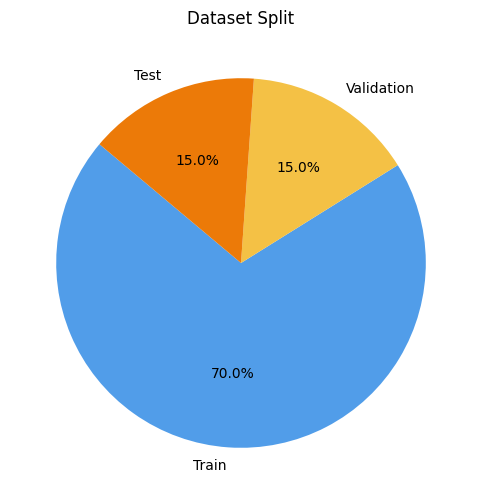

In [14]:
# Calculate sample sizes
train_size = len(train_df)
val_size = len(val_df)
test_size = len(test_df)
total = train_size +  val_size + test_size

# Calculate percentages
train_percent = 100 * train_size / total
val_percent = 100 *  val_size / total
test_percent = 100 * test_size / total

# Plotting
plt.figure(figsize=(10,6))

# Pie Chart
sizes = [train_size, val_size, test_size]
labels = ['Train', 'Validation', 'Test']
colors = ['#519DE9','#F4C145', '#EC7A08']
plt.pie(sizes, labels= labels, autopct = '%1.1f%%', colors = colors, startangle=140)
plt.title('Dataset Split')

plt.show()

### 3.6 - Data Augmentation

In [15]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.406], std=[0.229, 0.224, 0.225])
])

In [16]:
train_transforms = transforms.Compose([
    transforms.Resize((HEIGHT, WIDTH)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.RandomCrop((HEIGHT, WIDTH), padding= 4),
    transforms.ToTensor()
])

# Only reshape test data 
test_transforms = transforms.Compose([
    transforms.Resize((HEIGHT,WIDTH)),
    transforms.ToTensor()
])

In [17]:
idx = random.sample(dataset_df.index.to_list(),1)[0]
aug_image = _load(dataset_df.image_path[idx], as_tensor=False)

### 3.7 - View Original Image and Augmented Images

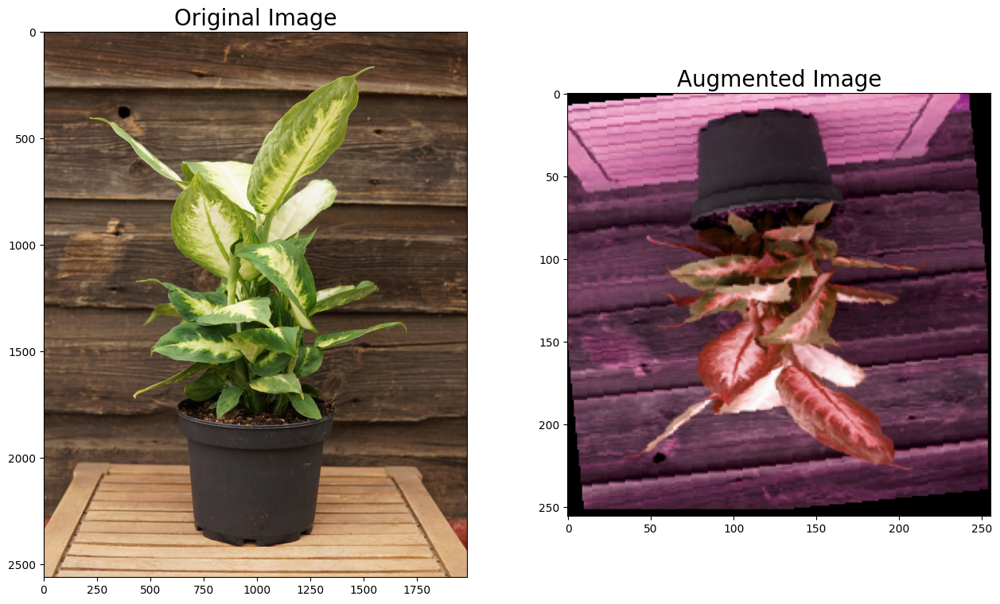

In [18]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,10))
fig.tight_layout(pad=6.0)
ax1.set_title('Original Image', fontsize=20)
ax1.imshow(aug_image);
ax2.set_title('Augmented Image', fontsize=20)
ax2.imshow(train_transforms(aug_image).permute(1,2,0));

In [19]:
class PlantDataset(Dataset):
    """Custom Dataset for loading plant images."""
    def __init__(self, df: pd.DataFrame, transform=None) -> None:
        super().__init__()

        self.paths = df['image_path'].to_list()
        self.labels = df['label'].to_list()
        self.transform = transform

        self.classes = sorted(list(df['label'].unique()))
        self.class_to_idx = {cls_name: _ for _, cls_name in enumerate(self.classes)}

    def load_image(self, index: int) -> Image.Image:
        image_path = self.paths[index]
        return Image.open(image_path).convert('RGB')

    def __len__(self) -> int:
        return len(self.paths)

    def __getitem__(self, index: int) -> Tuple[torch.Tensor, int]:
        image = self.load_image(index)
        class_name = self.labels[index]
        class_idx = self.class_to_idx[class_name]

        if self.transform:
            return self.transform(image), class_idx
        else:
            return image, class_idx

### 3.8 - Build train/valid/test dataset

In [20]:
train_ds = PlantDataset(train_df, transform= train_transforms)
val_ds = PlantDataset(val_df, transform = test_transforms)
test_ds = PlantDataset(test_df, transform= test_transforms)

In [21]:
train_loader = DataLoader(
    dataset = train_ds,
    batch_size = BATCH_SIZE,
    num_workers = NUM_WORKERS,
    shuffle = APPLY_SHUFFLE
)

val_loader = DataLoader(
    dataset= val_ds,
    batch_size = BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=(not APPLY_SHUFFLE)
)

test_loader = DataLoader(
    dataset = test_ds,
    batch_size = BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=(not APPLY_SHUFFLE)
)

## 4 - Build Model

*  Resnet
*  EfficientNet
*  Vision Transformer

In [23]:
# Function to calculate Top-1 and Top-5 accuracy
def accuracy_topk(output, target, topk=(1,)):
    """
    Computes the accuracy over the k top predictions for the specified values of k.

    Args:
        output (Tensor): Model output.
        target (Tensor): Ground truth labels.
        topk (tuple): Tuple of top-k values.

    Returns:
        list: List of accuracies for each top-k value.
    """
    maxk = max(topk)
    batch_size = target.size(0)

    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))

    res = []
    for k in topk:
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim=True)
        res.append(correct_k.mul_(100.0 / batch_size))
    return res


# Function to train and validate models
def train_and_evaluate(model, train_loader, val_loader, criterion, optimizer, num_epochs, model_name, num_classes):
    """
    Train and evaluate the model.

    Args:
        model (nn.Module): Model to be trained.
        train_loader (DataLoader): DataLoader for training data.
        val_loader (DataLoader): DataLoader for validation data.
        criterion (nn.Module): Loss function.
        optimizer (optim.Optimizer): Optimizer.
        num_epochs (int): Number of epochs.
        model_name (str): Name of the model.
        num_classes (int): Number of classes.

    Returns:
        tuple: Performance metrics.
    """    
    train_losses = []
    val_losses = []
    train_accuracies_top1 = []
    train_accuracies_top5 = []
    val_accuracies_top1 = []
    val_accuracies_top5 = []
    f1_scores = []
    auc_scores = []

    # Track time
    start_time = time.time()

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        running_corrects_top1 = 0
        running_corrects_top5 = 0

        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)

            # Compute loss
            loss = criterion(outputs, labels)

            # Backpropagation
            loss.backward()
            optimizer.step()

            # Update running loss
            running_loss += loss.item() * inputs.size(0)

            # Calculate top-1 and top-5 accuracies
            acc_top1, acc_top5 = accuracy_topk(outputs, labels, topk=(1, 5))
            running_corrects_top1 += acc_top1.item()
            running_corrects_top5 += acc_top5.item()

        train_loss = running_loss / len(train_loader.dataset)
        train_acc_top1 = running_corrects_top1 / len(train_loader)
        train_acc_top5 = running_corrects_top5 / len(train_loader)

        train_losses.append(train_loss)
        train_accuracies_top1.append(train_acc_top1)
        train_accuracies_top5.append(train_acc_top5)

        # Validation phase
        model.eval()
        running_loss = 0.0
        running_corrects_top1 = 0
        running_corrects_top5 = 0
        all_labels = []
        all_preds = []
        all_probs = []

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                loss = criterion(outputs, labels)

                # Update running loss
                running_loss += loss.item() * inputs.size(0)

                # Calculate top-1 and top-5 accuracies
                acc_top1, acc_top5 = accuracy_topk(outputs, labels, topk=(1, 5))
                running_corrects_top1 += acc_top1.item()
                running_corrects_top5 += acc_top5.item()

                all_labels.append(labels.cpu().numpy())
                all_probs.append(torch.softmax(outputs, dim=1).cpu().numpy())

        val_loss = running_loss / len(val_loader.dataset)
        val_acc_top1 = running_corrects_top1 / len(val_loader)
        val_acc_top5 = running_corrects_top5 / len(val_loader)

        val_losses.append(val_loss)
        val_accuracies_top1.append(val_acc_top1)
        val_accuracies_top5.append(val_acc_top5)

        # Compute F1-Score and AUC
        all_labels = np.concatenate(all_labels)
        all_probs = np.concatenate(all_probs)

        # Calculate F1-Score (macro for multi-class)
        f1 = f1_score(all_labels, np.argmax(all_probs, axis=1), average='macro')
        f1_scores.append(f1)

        # Calculate AUC (One-vs-Rest for multi-class)
        all_labels_bin = label_binarize(all_labels, classes=np.arange(num_classes))  # Binarize labels
        auc = roc_auc_score(all_labels_bin, all_probs, multi_class='ovr')
        auc_scores.append(auc)

        # Print results for each epoch
        print(f'{model_name} - Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, '
              f'Train Top-1 Acc: {train_acc_top1:.4f}, Train Top-5 Acc: {train_acc_top5:.4f}, '
              f'Val Loss: {val_loss:.4f}, Val Top-1 Acc: {val_acc_top1:.4f}, Val Top-5 Acc: {val_acc_top5:.4f}, '
              f'F1-Score: {f1:.4f}, AUC: {auc:.4f}')

    total_time = time.time() - start_time
    print(f'Training {model_name} completed in {total_time // 60:.0f}m {total_time % 60:.0f}s')

    # Return performance metrics
    return train_losses, val_losses, train_accuracies_top1, val_accuracies_top1, train_accuracies_top5, val_accuracies_top5, f1_scores, auc_scores, total_time

In [24]:
def plot_metric_comparison(model_names, metric_dict, metric_name, ylabel, title):
    """
    Helper function to plot the comparison of models' performance metrics.

    Args:
        model_names (list): List of model names.
        metric_dict (dict): Dictionary containing metrics for each model.
        metric_name (str): The name of the metric to display in the legend.
        ylabel (str): Label for the y-axis.
        title (str): Title for the plot.
    """
    plt.figure(figsize=(20, 5))
    for model_name in model_names:
        plt.plot(metric_dict[model_name], label=f'{model_name} {metric_name}', marker='o')
    plt.xlabel('Epochs')
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.show()

def plot_performance(model_names, train_losses_dict, val_losses_dict, train_acc_top1_dict, 
                                 val_acc_top1_dict, train_acc_top5_dict, val_acc_top5_dict, 
                                 f1_scores_dict, auc_scores_dict):
    """
    Plot the performance of models across various metrics.

    Args:
        model_names (list): List of model names.
        train_losses_dict (dict): Dictionary of training losses.
        val_losses_dict (dict): Dictionary of validation losses.
        train_acc_top1_dict (dict): Dictionary of training top-1 accuracies.
        val_acc_top1_dict (dict): Dictionary of validation top-1 accuracies.
        train_acc_top5_dict (dict): Dictionary of training top-5 accuracies.
        val_acc_top5_dict (dict): Dictionary of validation top-5 accuracies.
        f1_scores_dict (dict): Dictionary of F1 scores.
        auc_scores_dict (dict): Dictionary of AUC scores.
    """
    # Loss Comparison
    plot_metric_comparison(model_names, train_losses_dict, 'Train Loss', 'Loss', 'Training Loss Comparison')
    plot_metric_comparison(model_names, val_losses_dict, 'Val Loss', 'Loss', 'Validation Loss Comparison')

    # Top-1 Accuracy Comparison
    plot_metric_comparison(model_names, train_acc_top1_dict, 'Train Top-1 Accuracy', 'Top-1 Accuracy', 'Training Top-1 Accuracy Comparison')
    plot_metric_comparison(model_names, val_acc_top1_dict, 'Val Top-1 Accuracy', 'Top-1 Accuracy', 'Validation Top-1 Accuracy Comparison')

    # Top-5 Accuracy Comparison
    plot_metric_comparison(model_names, train_acc_top5_dict, 'Train Top-5 Accuracy', 'Top-5 Accuracy', 'Training Top-5 Accuracy Comparison')
    plot_metric_comparison(model_names, val_acc_top5_dict, 'Val Top-5 Accuracy', 'Top-5 Accuracy', 'Validation Top-5 Accuracy Comparison')

    # F1-Score Comparison
    plot_metric_comparison(model_names, f1_scores_dict, 'F1-Score', 'F1-Score', 'F1-Score Comparison')

    # AUC Comparison
    plot_metric_comparison(model_names, auc_scores_dict, 'AUC', 'AUC', 'AUC Comparison')


In [25]:

# Initialize device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Modify the last layers of models to match the number of classes
num_classes = NUM_CLASSES

resnet = models.resnet18(pretrained=True)
for param in resnet.parameters():
    param.requires_grad = False
resnet.fc = nn.Linear(resnet.fc.in_features, num_classes)
resnet = resnet.to(device)

efficientnet = models.efficientnet_b0(pretrained=True)
efficientnet.classifier[1] = nn.Linear(efficientnet.classifier[1].in_features, num_classes)
efficientnet = efficientnet.to(device)

vit = timm.create_model('vit_base_patch16_224',img_size=256, pretrained=True, num_classes=num_classes)
vit = vit.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 177MB/s]
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 134MB/s] 


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

## 5 - Training

In [26]:

num_epochs = EPOCHS


criterion = nn.CrossEntropyLoss()
optimizer_resnet = optim.SGD(resnet.parameters(), lr=0.001, momentum=0.9)
optimizer_efficientnet = optim.SGD(efficientnet.parameters(), lr=0.001, momentum=0.9)
optimizer_vit = optim.Adam(vit.parameters(), lr=0.001)

# Train ResNet
train_losses_resnet, val_losses_resnet, train_acc1_resnet, val_acc1_resnet, train_acc5_resnet, val_acc5_resnet, f1_scores_resnet, auc_scores_resnet, time_resnet = train_and_evaluate(
    resnet, train_loader, val_loader, criterion, optimizer_resnet, num_epochs, 'ResNet', num_classes
)

# Train EfficientNet
train_losses_efficientnet, val_losses_efficientnet, train_acc1_efficientnet, val_acc1_efficientnet, train_acc5_efficientnet, val_acc5_efficientnet, f1_scores_efficientnet, auc_scores_efficientnet, time_efficientnet = train_and_evaluate(
    efficientnet, train_loader, val_loader, criterion, optimizer_efficientnet, num_epochs, 'EfficientNet', num_classes
)

# Train Vision Transformer (ViT)
train_losses_vit, val_losses_vit, train_acc1_vit, val_acc1_vit, train_acc5_vit, val_acc5_vit, f1_scores_vit, auc_scores_vit, time_vit = train_and_evaluate(
    vit, train_loader, val_loader, criterion, optimizer_vit, num_epochs, 'Vision Transformer', num_classes
)

ResNet - Epoch [1/24], Train Loss: 3.1027, Train Top-1 Acc: 24.3323, Train Top-5 Acc: 51.6090, Val Loss: 2.2285, Val Top-1 Acc: 44.8679, Val Top-5 Acc: 77.1172, F1-Score: 0.3881, AUC: 0.9472
ResNet - Epoch [2/24], Train Loss: 2.2370, Train Top-1 Acc: 46.7710, Train Top-5 Acc: 76.9264, Val Loss: 1.8179, Val Top-1 Acc: 52.0833, Val Top-5 Acc: 80.3523, F1-Score: 0.4755, AUC: 0.9629
ResNet - Epoch [3/24], Train Loss: 1.8937, Train Top-1 Acc: 53.2728, Train Top-5 Acc: 81.8739, Val Loss: 1.5613, Val Top-1 Acc: 57.7744, Val Top-5 Acc: 85.9079, F1-Score: 0.5458, AUC: 0.9696
ResNet - Epoch [4/24], Train Loss: 1.7280, Train Top-1 Acc: 56.2281, Train Top-5 Acc: 84.1725, Val Loss: 1.4784, Val Top-1 Acc: 59.8069, Val Top-5 Acc: 87.0766, F1-Score: 0.5662, AUC: 0.9713
ResNet - Epoch [5/24], Train Loss: 1.6044, Train Top-1 Acc: 58.6690, Train Top-5 Acc: 85.6392, Val Loss: 1.4125, Val Top-1 Acc: 61.1280, Val Top-5 Acc: 87.4661, F1-Score: 0.5817, AUC: 0.9737
ResNet - Epoch [6/24], Train Loss: 1.5089, Tr

## 6 -  Model Evaluation

In [27]:
train_losses_dict = {}
val_losses_dict = {}
train_acc1_dict = {}
val_acc1_dict = {}
train_acc5_dict = {}
val_acc5_dict = {}
f1_scores_dict = {}
auc_scores_dict = {}


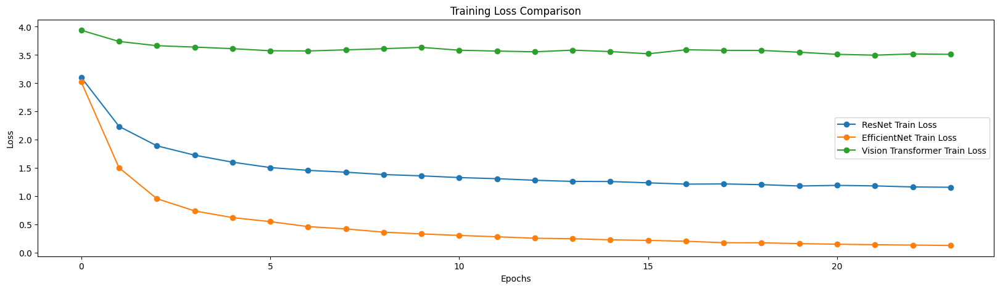

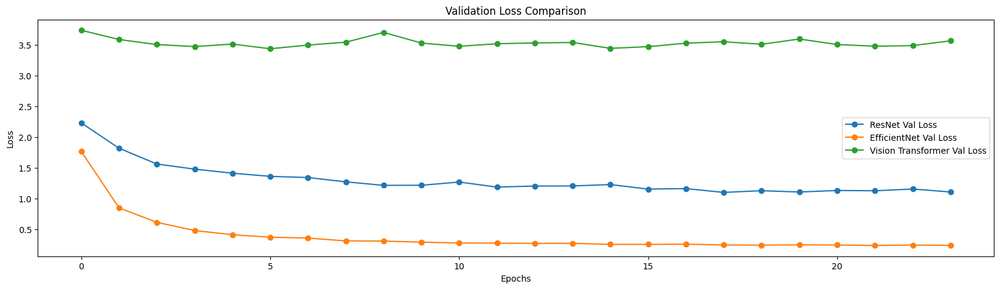

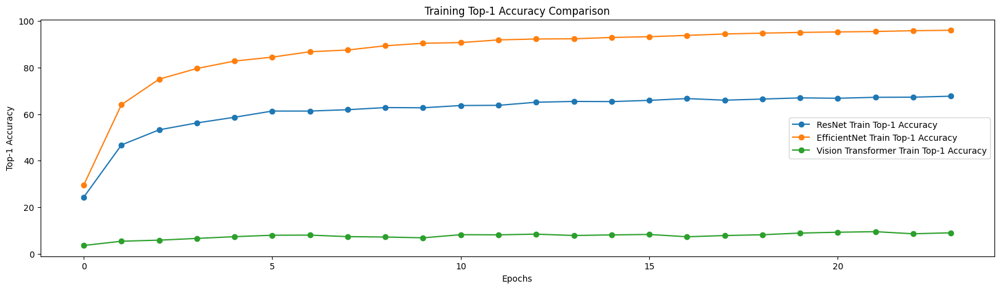

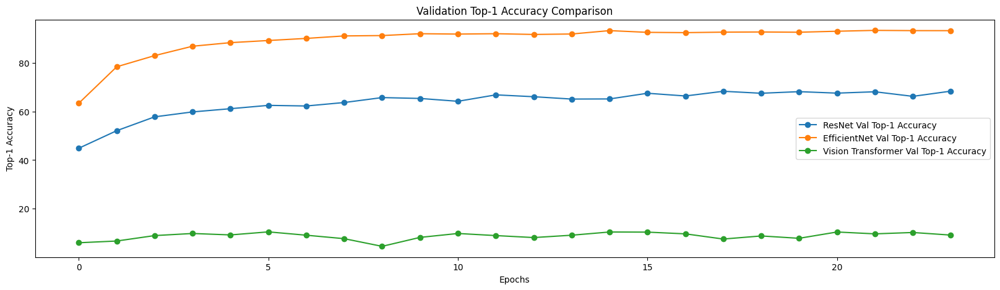

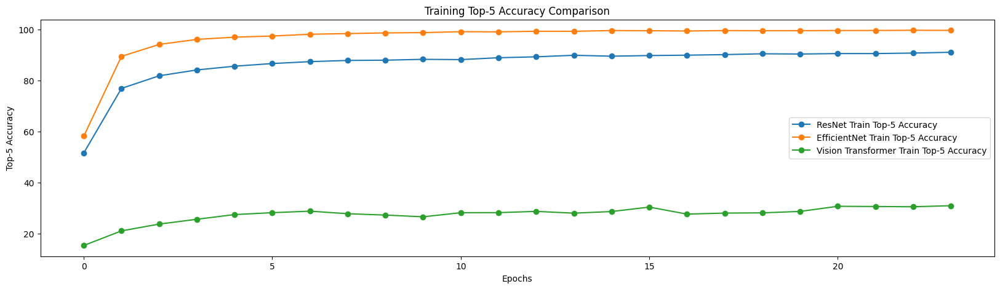

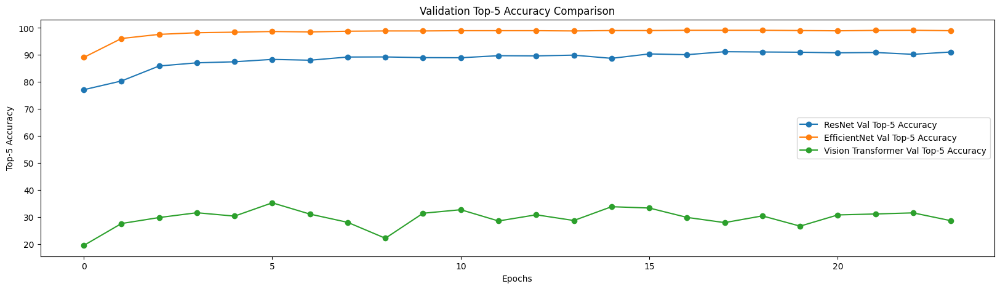

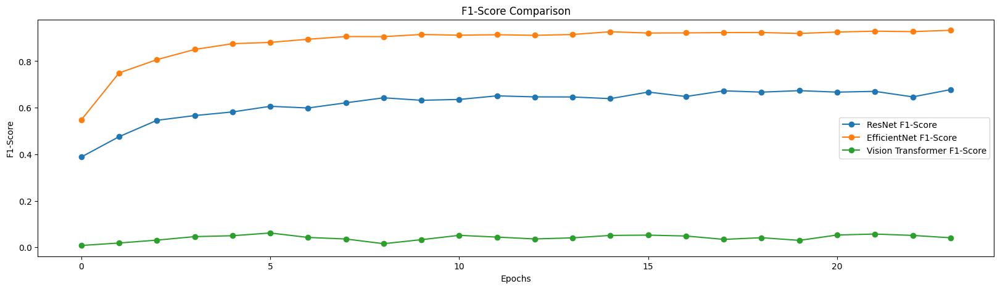

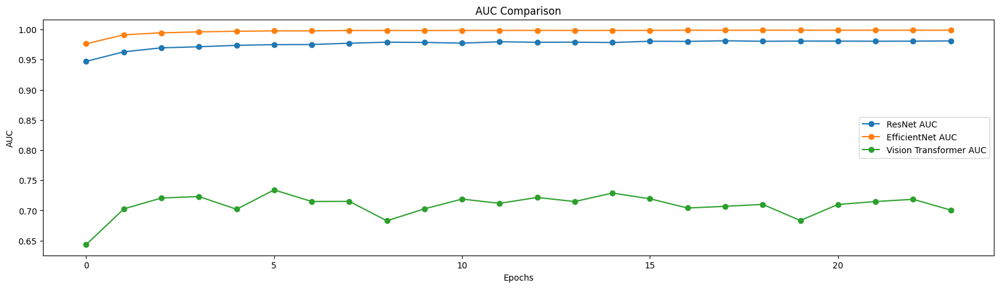

In [28]:
# Store the results in dictionaries
train_losses_dict['ResNet'] = train_losses_resnet
val_losses_dict['ResNet'] = val_losses_resnet
train_acc1_dict['ResNet'] = train_acc1_resnet
val_acc1_dict['ResNet'] = val_acc1_resnet
train_acc5_dict['ResNet'] = train_acc5_resnet
val_acc5_dict['ResNet'] = val_acc5_resnet
f1_scores_dict['ResNet'] = f1_scores_resnet
auc_scores_dict['ResNet'] = auc_scores_resnet

train_losses_dict['EfficientNet'] = train_losses_efficientnet
val_losses_dict['EfficientNet'] = val_losses_efficientnet
train_acc1_dict['EfficientNet'] = train_acc1_efficientnet
val_acc1_dict['EfficientNet'] = val_acc1_efficientnet
train_acc5_dict['EfficientNet'] = train_acc5_efficientnet
val_acc5_dict['EfficientNet'] = val_acc5_efficientnet
f1_scores_dict['EfficientNet'] = f1_scores_efficientnet
auc_scores_dict['EfficientNet'] = auc_scores_efficientnet

train_losses_dict['Vision Transformer'] = train_losses_vit
val_losses_dict['Vision Transformer'] = val_losses_vit
train_acc1_dict['Vision Transformer'] = train_acc1_vit
val_acc1_dict['Vision Transformer'] = val_acc1_vit
train_acc5_dict['Vision Transformer'] = train_acc5_vit
val_acc5_dict['Vision Transformer'] = val_acc5_vit
f1_scores_dict['Vision Transformer'] = f1_scores_vit
auc_scores_dict['Vision Transformer'] = auc_scores_vit

# Plot comparison
plot_performance(['ResNet', 'EfficientNet', 'Vision Transformer'], train_losses_dict, val_losses_dict, train_acc1_dict, val_acc1_dict, train_acc5_dict, val_acc5_dict, f1_scores_dict, auc_scores_dict)

### Comparisions:

Analyzing the training outcomes and performance metrics, we can draw several conclusions:

EfficientNet outperformed ResNet and Vision Transformer in accuracy, F1-Score, and AUC, with the highest top-1 validation accuracy of 93.22% and the lowest validation loss of 0.2398.

In terms of training efficiency, EfficientNet finished in 83 minutes and 51 seconds, which is comparable to ResNet's 79 minutes and 59 seconds but far faster than Vision Transformer's 186 minutes and 3 seconds.

Vision Transformer trailed behind, with the lowest accuracy and largest losses. This suggests that it may not be the greatest fit for this dataset, or that it will require more thorough training and tuning.

Overall, the training results show that EfficientNet is the best model for this task, since it combines high performance with fast training times. ResNet produced good results, but fell short of EfficientNet in terms of accuracy and efficiency.

## 7 - Predict on test data

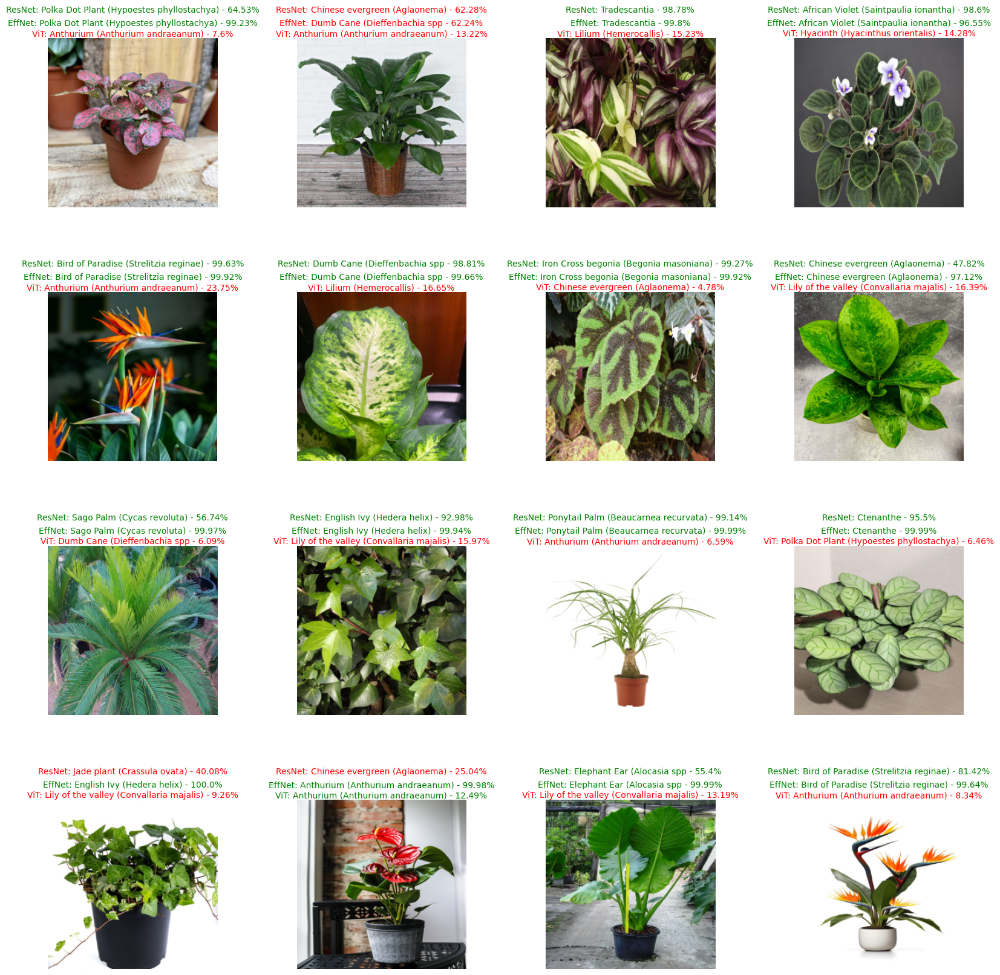

In [29]:
resnet.eval()
efficientnet.eval()
vit.eval()

# Get a batch of test data
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)

# Make predictions with ResNet
with torch.no_grad():
    outputs_resnet = resnet(images)
    predictions_resnet = torch.softmax(outputs_resnet, dim=1)
    predicted_classes_resnet = torch.argmax(predictions_resnet, dim=1)

# Make predictions with EfficientNet
with torch.no_grad():
    outputs_efficientnet = efficientnet(images)
    predictions_efficientnet = torch.softmax(outputs_efficientnet, dim=1)
    predicted_classes_efficientnet = torch.argmax(predictions_efficientnet, dim=1)

# Make predictions with Vision Transformer (ViT)
with torch.no_grad():
    outputs_vit = vit(images)
    predictions_vit = torch.softmax(outputs_vit, dim=1)
    predicted_classes_vit = torch.argmax(predictions_vit, dim=1)


images = images.cpu()
predicted_classes_resnet = predicted_classes_resnet.cpu()
predictions_resnet = predictions_resnet.cpu()
predicted_classes_efficientnet = predicted_classes_efficientnet.cpu()
predictions_efficientnet = predictions_efficientnet.cpu()
predicted_classes_vit = predicted_classes_vit.cpu()
predictions_vit = predictions_vit.cpu()
labels = labels.cpu()

class_names = test_ds.classes


plt.figure(figsize=(20, 20))

for i in range(16):  
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].permute(1, 2, 0))  # Rearrange the image tensor for display (C, H, W) to (H, W, C)
    plt.axis('off')
    
    real_class = class_names[labels[i].item()]
    
    predicted_class_resnet = class_names[predicted_classes_resnet[i].item()]
    predicted_class_efficientnet = class_names[predicted_classes_efficientnet[i].item()]
    predicted_class_vit = class_names[predicted_classes_vit[i].item()]
    
    prob_resnet = torch.max(predictions_resnet[i]).item()
    prob_efficientnet = torch.max(predictions_efficientnet[i]).item()
    prob_vit = torch.max(predictions_vit[i]).item()
    
    color_resnet = 'green' if real_class == predicted_class_resnet else 'red'
    color_efficientnet = 'green' if real_class == predicted_class_efficientnet else 'red'
    color_vit = 'green' if real_class == predicted_class_vit else 'red'
    
    plt.text(0.5, 1.15, f"ResNet: {predicted_class_resnet} - {round(100 * prob_resnet, 2)}%", 
             color=color_resnet, fontsize=10, ha='center', transform=plt.gca().transAxes)
    
    plt.text(0.5, 1.07, f"EffNet: {predicted_class_efficientnet} - {round(100 * prob_efficientnet, 2)}%", 
             color=color_efficientnet, fontsize=10, ha='center', transform=plt.gca().transAxes)
    
    plt.text(0.5, 1.01, f"ViT: {predicted_class_vit} - {round(100 * prob_vit, 2)}%", 
             color=color_vit, fontsize=10, ha='center', transform=plt.gca().transAxes)

plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

## 8 - Saving Models

In [30]:
torch.save(resnet.state_dict(), 'resnet_model.pth')
torch.save(efficientnet.state_dict(), 'efficientnet_model.pth')
torch.save(vit.state_dict(), 'vit_model.pth')

In [31]:
# Save the entire model
torch.save(resnet, 'resnet_model_full.pth')
torch.save(efficientnet, 'efficientnet_model_full.pth')
torch.save(vit, 'vit_model_full.pth')